In [1]:
import numpy as np
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
import yaml
from skimage import exposure, util
from skimage.transform import resize
import sklearn.model_selection
from tqdm import tqdm
import pickle


In [2]:
data_paths = glob.glob( '../data/input/keren/*.npz')

## I. Exploratory Data Analysis & Selection of Markers

In [3]:
# Defining cell type and channel dictionaries based off meta.yaml
with open("../data/input/keren/meta.yaml", 'r') as stream:
    data = yaml.safe_load(stream)

cell_types_dict = data['cell_types']
channels_dict = {i: j for i, j in enumerate(data['channels'])}
print(cell_types_dict)
print(channels_dict)

{0: 'Background', 1: 'Unidentified', 2: 'Endothelial', 3: 'Mesenchyme', 4: 'Tumor', 5: 'Tregs', 6: 'CD4T', 7: 'CD8T', 8: 'CD3T', 9: 'Nk', 10: 'Bcell', 11: 'Neutrophil', 12: 'Macrophage', 13: 'DC', 14: 'DC_Mono', 15: 'Mono_Neu', 16: 'Immune_other', 17: 'FAILED_HARMONIZATION'}
{0: 'Au', 1: 'B7H3', 2: 'Beta-catenin', 3: 'C', 4: 'CD11b', 5: 'CD11c', 6: 'CD138', 7: 'CD16', 8: 'CD163', 9: 'CD20', 10: 'CD209', 11: 'CD3', 12: 'CD31', 13: 'CD4', 14: 'CD45', 15: 'CD45RO', 16: 'CD56', 17: 'CD63', 18: 'CD68', 19: 'CD8', 20: 'CSF-1R', 21: 'Ca', 22: 'EGFR', 23: 'Fe', 24: 'FoxP3', 25: 'H3K27me3', 26: 'H3K9ac', 27: 'HLA-DR', 28: 'HLA-Class-1', 29: 'IDO', 30: 'Keratin17', 31: 'Keratin6', 32: 'Ki67', 33: 'Lag3', 34: 'MPO', 35: 'Na', 36: 'OX40', 37: 'P', 38: 'PDL1', 39: 'PD1', 40: 'PanCK', 41: 'SMA', 42: 'Si', 43: 'Ta', 44: 'Vimentin', 45: 'dsDNA', 46: 'p53', 47: 'pS6', 48: 'background', 49: 'sum of H3K27me3, H3K9ac, and dsDNA', 50: 'sum_PanCK_CD45'}


In [4]:
with np.load(data_paths[1], allow_pickle=True) as f:
    X = f['X']
    y = f['y']
    cell_types = f['cell_types'].item()

print(X.shape, y.shape)

(1, 2048, 2048, 51) (1, 2048, 2048, 2)


In [5]:
# # make sure that the cell type dictinary indexes match the y array values
# np.max(y[...,0])
# len(cell_types.keys())

In [6]:
def normalize_image(image):
    """
    Normalizes an image using contrast stretching.
    """
    # stretch contrast
    p2, p98 = np.percentile(image, (2, 98))
    image = exposure.rescale_intensity(image, in_range=(p2, p98))
    # rescale the image to the range [-1, 1]
    image = util.img_as_float32(image)
    return image
def select_random_cell_indices(cell_types, n=25):
    """
    Returns a list of cell indices containing 25 cells of each type.
    """
    selected_cell_indices = []
    for value in set(cell_types.values()):
        keys = [key for key, val in cell_types.items() if val == value]
        np.random.shuffle(keys)
        selected_cell_indices.extend(keys[:n])
    return selected_cell_indices
def get_cell_views(image, cell_mask, cell_types):
    """
    Returns a list of cell views and a list of associated cell types.
    """
    cell_views = []
    cell_types_list = []
    # get random indices for 15 cells of each type cell type
    cell_type_indices = select_random_cell_indices(cell_types, n=15)
    for j in cell_type_indices:
        # mask the cell view to get only the current cell type
        masked_view = np.ma.masked_where(cell_mask != j, image)
        # append the masked view and associated cell type to the lists
        cell_views.append(masked_view)
        cell_types_list.append(cell_types[j])
    return cell_views, cell_types_list


In [7]:
# apply contrast stretching to each channel 
X_norm = np.zeros_like(X)
for i in range(X.shape[-1]):
    X_norm[..., i] = normalize_image(X[..., i])
# check the shape of the output array
print(X_norm.shape)  # should be (1, 2048, 2048, 51)

(1, 2048, 2048, 51)


In [265]:
# create an empty dataframe with columns "column1", "column2"
df_marker_values = pd.DataFrame(columns=["marker", "cell_type", "cell_index", "mean_cell_intensity"])

for channel_key in tqdm(list(range(X.shape[-1]))):
    print('Processing: ' + channels_dict[channel_key])
    cell_views, cell_types_list = get_cell_views(X_norm[0,:,:,channel_key], y[0,:,:,0], cell_types)
    for i in range(len(cell_views)):
        cell_type_key = cell_types_list[i]
        view = cell_views[i]
        mean_val = np.mean(view, axis=(0, 1))
        df_marker_values.loc[len(df_marker_values)] = [channels_dict[channel_key], cell_types_dict[cell_type_key], i, mean_val]


  0%|          | 0/51 [00:00<?, ?it/s]

Processing: Au


  2%|▏         | 1/51 [00:40<33:21, 40.03s/it]

Processing: B7H3


  4%|▍         | 2/51 [01:12<29:13, 35.78s/it]

Processing: Beta-catenin


  6%|▌         | 3/51 [01:45<27:39, 34.57s/it]

Processing: C


  8%|▊         | 4/51 [02:17<26:17, 33.56s/it]

Processing: CD11b


 10%|▉         | 5/51 [02:50<25:22, 33.09s/it]

Processing: CD11c


 12%|█▏        | 6/51 [03:21<24:24, 32.55s/it]

Processing: CD138


 14%|█▎        | 7/51 [03:53<23:42, 32.34s/it]

Processing: CD16


 16%|█▌        | 8/51 [04:25<22:59, 32.08s/it]

Processing: CD163


 18%|█▊        | 9/51 [04:56<22:16, 31.83s/it]

Processing: CD20


 20%|█▉        | 10/51 [05:31<22:24, 32.79s/it]

Processing: CD209


 22%|██▏       | 11/51 [06:05<22:10, 33.25s/it]

Processing: CD3


 24%|██▎       | 12/51 [06:36<21:10, 32.56s/it]

Processing: CD31


 25%|██▌       | 13/51 [07:07<20:15, 31.99s/it]

Processing: CD4


 27%|██▋       | 14/51 [07:37<19:24, 31.47s/it]

Processing: CD45


 29%|██▉       | 15/51 [08:08<18:50, 31.41s/it]

Processing: CD45RO


 31%|███▏      | 16/51 [08:37<17:48, 30.52s/it]

Processing: CD56


 33%|███▎      | 17/51 [09:06<17:06, 30.19s/it]

Processing: CD63


 35%|███▌      | 18/51 [09:36<16:30, 30.02s/it]

Processing: CD68


 37%|███▋      | 19/51 [10:06<16:00, 30.01s/it]

Processing: CD8


 39%|███▉      | 20/51 [10:37<15:42, 30.42s/it]

Processing: CSF-1R


 41%|████      | 21/51 [11:08<15:15, 30.51s/it]

Processing: Ca


 43%|████▎     | 22/51 [11:40<14:59, 31.03s/it]

Processing: EGFR


 45%|████▌     | 23/51 [12:10<14:17, 30.61s/it]

Processing: Fe


 47%|████▋     | 24/51 [12:40<13:41, 30.42s/it]

Processing: FoxP3


 49%|████▉     | 25/51 [13:09<12:58, 29.92s/it]

Processing: H3K27me3


 51%|█████     | 26/51 [13:41<12:43, 30.54s/it]

Processing: H3K9ac


 53%|█████▎    | 27/51 [14:09<11:58, 29.93s/it]

Processing: HLA-DR


 55%|█████▍    | 28/51 [14:39<11:25, 29.80s/it]

Processing: HLA-Class-1


 57%|█████▋    | 29/51 [15:08<10:56, 29.85s/it]

Processing: IDO


 59%|█████▉    | 30/51 [15:37<10:17, 29.43s/it]

Processing: Keratin17


 61%|██████    | 31/51 [16:05<09:42, 29.12s/it]

Processing: Keratin6


 63%|██████▎   | 32/51 [16:38<09:33, 30.20s/it]

Processing: Ki67


 65%|██████▍   | 33/51 [17:13<09:28, 31.59s/it]

Processing: Lag3


 67%|██████▋   | 34/51 [17:43<08:48, 31.07s/it]

Processing: MPO


 69%|██████▊   | 35/51 [18:14<08:17, 31.06s/it]

Processing: Na


 71%|███████   | 36/51 [18:51<08:13, 32.90s/it]

Processing: OX40


 73%|███████▎  | 37/51 [19:19<07:21, 31.56s/it]

Processing: P


 75%|███████▍  | 38/51 [19:50<06:46, 31.29s/it]

Processing: PDL1


 76%|███████▋  | 39/51 [20:20<06:08, 30.75s/it]

Processing: PD1


 78%|███████▊  | 40/51 [20:47<05:28, 29.86s/it]

Processing: PanCK


 80%|████████  | 41/51 [21:16<04:55, 29.60s/it]

Processing: SMA


 82%|████████▏ | 42/51 [21:46<04:25, 29.48s/it]

Processing: Si


 84%|████████▍ | 43/51 [22:16<03:59, 29.88s/it]

Processing: Ta


 86%|████████▋ | 44/51 [22:47<03:29, 29.97s/it]

Processing: Vimentin


 88%|████████▊ | 45/51 [23:15<02:56, 29.41s/it]

Processing: dsDNA


 90%|█████████ | 46/51 [23:41<02:23, 28.61s/it]

Processing: p53


 92%|█████████▏| 47/51 [24:10<01:54, 28.55s/it]

Processing: pS6


 94%|█████████▍| 48/51 [24:39<01:26, 28.76s/it]

Processing: background


 96%|█████████▌| 49/51 [25:08<00:57, 28.82s/it]

Processing: sum of H3K27me3, H3K9ac, and dsDNA


 98%|█████████▊| 50/51 [25:36<00:28, 28.72s/it]

Processing: sum_PanCK_CD45


100%|██████████| 51/51 [26:06<00:00, 30.71s/it]


Saving CSV file with marker data

In [52]:
# df_marker_values.to_csv('../data/interim/2023-04-19_cell-marker-df.csv')

In [102]:
df_marker_values = pd.read_csv('../data/interim/2023-04-19_cell-marker-df.csv')
marker_stats = df_marker_values.groupby(['cell_type', 'marker']).agg({'mean_cell_intensity': ['mean', 'std']})
marker_stats

mean_cell_intensity          
                                                               mean       std
cell_type    marker                                                          
Background   Au                                            0.352730       NaN
             B7H3                                          0.000000       NaN
             Beta-catenin                                  0.059559       NaN
             C                                             0.000000       NaN
             CD11b                                         0.000000       NaN
...                                                             ...       ...
Unidentified dsDNA                                         0.174598  0.117962
             p53                                           0.000000  0.000000
             pS6                                           0.097160  0.164702
             sum of H3K27me3, H3K9ac, and dsDNA            0.181024  0.124461
             sum_PanCK_CD45                                0.016152  0.034732

[918 rows x 2 columns]

In [103]:
df_long = marker_stats.stack().reset_index()
df_wide = (df_long.pivot(index=['cell_type','marker'],columns="level_2", values="mean_cell_intensity")
         .sort_index(level=[1,0]))
df_wide = df_wide.reset_index().rename(columns={'index': 'index_col'})
df_wide

level_2,cell_type,marker,mean,std
0,Background,Au,0.352730,NaN
1,Bcell,Au,0.059610,0.102201
2,CD3T,Au,0.078947,0.117078
3,CD4T,Au,0.107756,0.158841
4,CD8T,Au,0.064824,0.099375
...,...,...,...,...
913,Neutrophil,sum_PanCK_CD45,0.183506,0.165716
914,Nk,sum_PanCK_CD45,0.410293,0.207544
915,Tregs,sum_PanCK_CD45,0.294039,0.180852
916,Tumor,sum_PanCK_CD45,0.271346,0.170234


/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 10 x 10 in image.
/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: ../figures/marker_heatmap.png


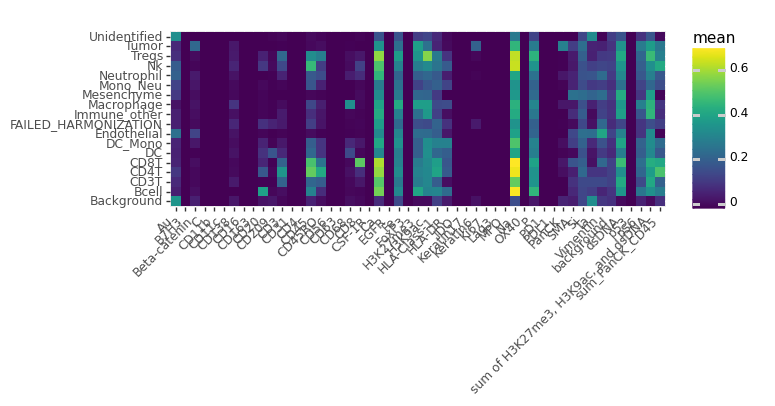

<ggplot: (370044061)>

In [106]:
from plotnine import *

p1 = (ggplot(df_wide, aes(x='marker', y='cell_type', fill='mean')) +
 geom_tile() +
 theme(axis_text_x=element_text(angle=45, hjust=1)) +
 labs(x='', y='') +
 coord_fixed())
p1.save("../figures/marker_heatmap.png", width=10, height=10, dpi=600, facecolor='w')
p1

In [127]:
df_wide

level_2,cell_type,marker,mean,std
0,Background,Au,0.352730,NaN
1,Bcell,Au,0.059610,0.102201
2,CD3T,Au,0.078947,0.117078
3,CD4T,Au,0.107756,0.158841
4,CD8T,Au,0.064824,0.099375
...,...,...,...,...
913,Neutrophil,sum_PanCK_CD45,0.183506,0.165716
914,Nk,sum_PanCK_CD45,0.410293,0.207544
915,Tregs,sum_PanCK_CD45,0.294039,0.180852
916,Tumor,sum_PanCK_CD45,0.271346,0.170234


In [48]:
marker_sd = df_wide.groupby('marker').agg({'mean': 'std'})
marker_sd = marker_sd.reset_index().rename(columns={'mean': 'sd_of_means'})
variable_markers = marker_sd.loc[marker_sd['sd_of_means'] >= 0.001]

# save dataframe to pickle file
variable_markers.to_pickle('../data/interim/variable_markers_df.pkl')
variable_markers

level_2,marker,sd_of_means
0,Au,0.097063
2,Beta-catenin,0.055114
6,CD138,0.026076
9,CD20,0.094711
10,CD209,0.042886
11,CD3,0.102766
14,CD45,0.161940
15,CD45RO,0.113170
18,CD68,0.082143
19,CD8,0.117771


/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 8 x 10 in image.
/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: ../figures/filtered_marker_heatmap.png


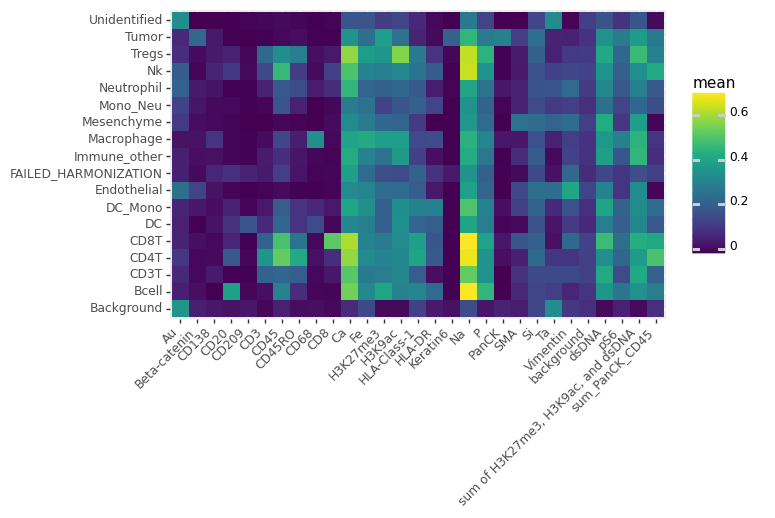

<ggplot: (370106362)>

In [107]:
df_wide_filtered = df_wide[df_wide['marker'].isin(variable_markers['marker'])]

p2 = (ggplot(df_wide_filtered, aes(x='marker', y='cell_type', fill='mean')) +
 geom_tile() +
 theme(axis_text_x=element_text(angle=45, hjust=1)) +
 labs(x='', y='') +
 coord_fixed())
p2.save("../figures/filtered_marker_heatmap.png", width=8, height=10, dpi=600, facecolor='w')
p2

Saving list of markers of interest as pickle file

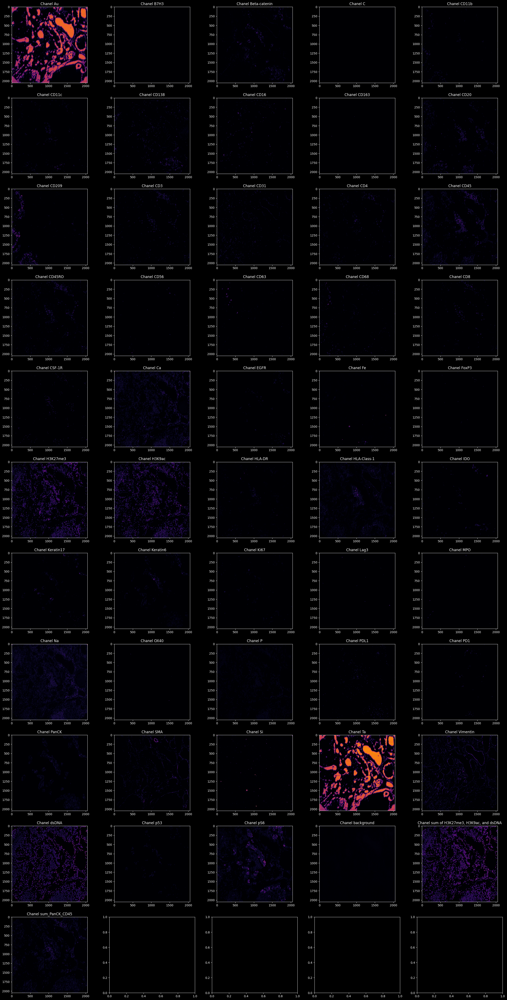

In [8]:
fig, axes = plt.subplots(11, 5, figsize=(30,60))
for i in range(51):
    axes.flatten()[i].imshow(X[0,...,i], cmap='inferno') 
    axes.flatten()[i].set_title('Chanel ' + str(channels_dict[i]))


Here we see the expression values for each of the 51 chanels of our image. We can see that some chanels have a much more ubiquitous or uniform signal than other chanels, which are more sparse and potentially more informative. The variability in signal strength suggests that we may need to normalize our data.

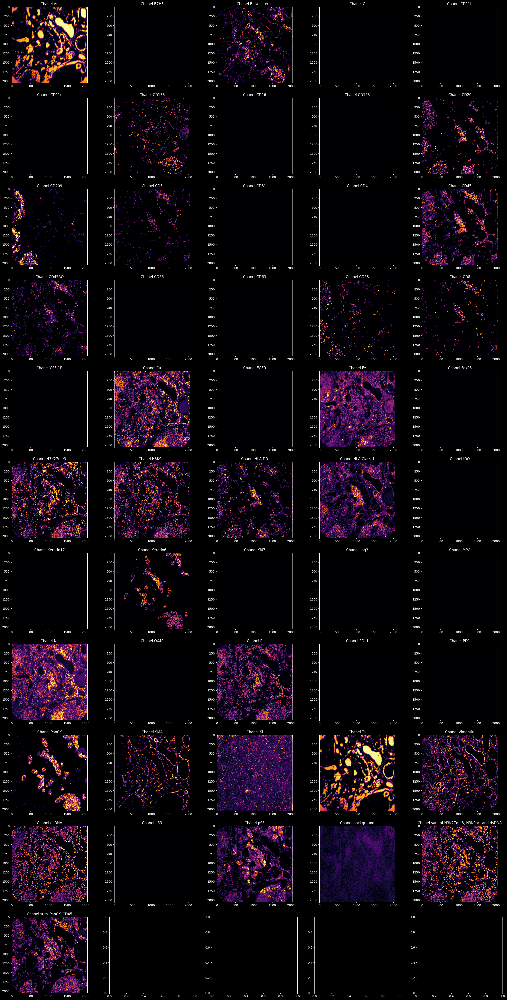

In [9]:
fig, axes = plt.subplots(11, 5, figsize=(30,60))
for i in range(51):
    axes.flatten()[i].imshow(X_norm[0,...,i], cmap='inferno')
    axes.flatten()[i].set_title('Chanel ' + str(channels_dict[i]))

Visualizing the segmentation masks

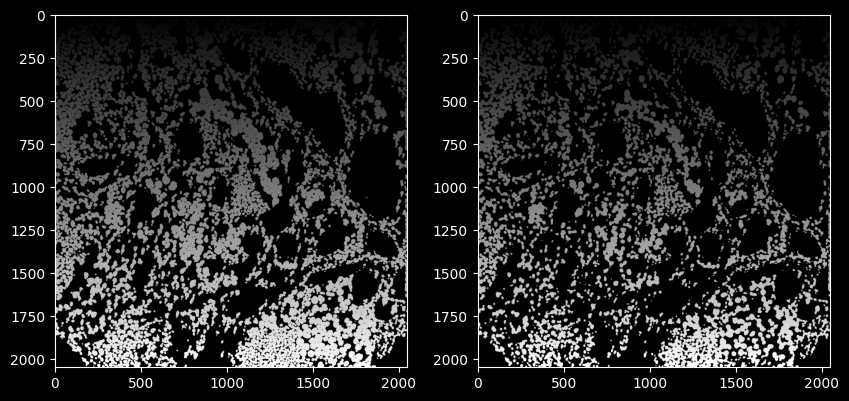

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(10, 20))
for i in range(2):
    axes.flatten()[i].imshow(y[0,...,i], cmap='gray')

# II: Linear Classifier

In [8]:
variable_markers = pd.read_pickle('../data/interim/variable_markers_df.pkl')

In [9]:
def get_cell_boxes(image, cell_mask, cell_types):
    """
    Returns a list of bounding boxes and a list of associated cell types.
    """
    cell_boxes = []
    cell_types_list = []
    # get random indices for 15 cells of each type cell type
    cell_type_indices = select_random_cell_indices(cell_types, n=15)
    # loop through cell types
    for j in cell_type_indices:
        cell_type = cell_types[j]
        # get indices for cells of current cell type
        cell_indices = np.where(cell_mask == j)
        # calculate cell center coordinates
        cell_centers = np.stack([cell_indices[0], cell_indices[1]], axis=-1)
        cell_centers = cell_centers.mean(axis=0)
        cell_center_row, cell_center_col = cell_centers.astype(int)
        # calculate cell bounding box coordinates
        bbox_row_min = max(0, cell_center_row - 10)
        bbox_row_max = min(cell_mask.shape[0]-1, cell_center_row + 10)
        bbox_col_min = max(0, cell_center_col - 10)
        bbox_col_max = min(cell_mask.shape[1]-1, cell_center_col + 10)
        # slice image to get cell view
        cell_view = image[bbox_row_min:bbox_row_max+1, bbox_col_min:bbox_col_max+1]
        # resize cell view to desired shape
        cell_view = resize(cell_view, (21, 21))
        # append the cell view and associated cell type to the lists
        cell_boxes.append(cell_view)
        cell_types_list.append(cell_type)
    return cell_boxes, cell_types_list


In [10]:
# Create empty arrays with the desired shape and dtype
cell_views = np.empty((len(variable_markers.index),), dtype=object)
cell_types_list = np.empty((len(variable_markers.index),), dtype=object)

for i, channel_key in enumerate(tqdm(variable_markers.index)):
    # print('Processing: ' + channels_dict[channel_key])
    cell_views[i], cell_types_list[i] = get_cell_boxes(X_norm[0,:,:,channel_key], y[0,:,:,0], cell_types)


100%|██████████| 29/29 [01:36<00:00,  3.33s/it]


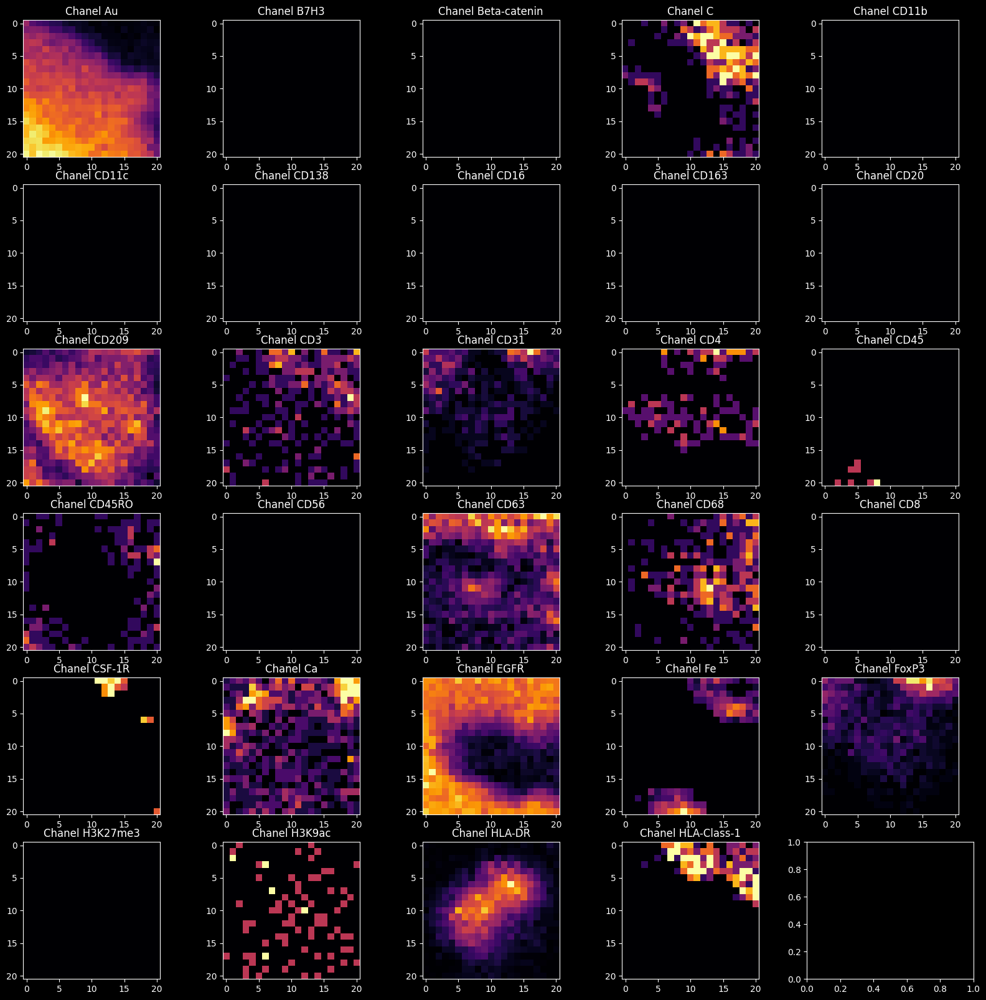

In [11]:
# plt.imshow(cell_views[0])
fig, axes = plt.subplots(6, 5, figsize=(20,20))
for i in range(len(variable_markers.index)):
    axes.flatten()[i].imshow(cell_views[i][1], cmap='inferno')
    axes.flatten()[i].set_title('Chanel ' + str(channels_dict[i])) 

Create cell views for each pre-determined channel of interest


In [12]:
# Create an empty ndarray to store the reshaped cell views
reshaped_cell_views = np.empty((len(cell_views), len(cell_views[0]), 21, 21))
# Loop through each channel and stack the images into the new ndarray
for i, channel in enumerate(cell_views):
    reshaped_cell_views[i] = np.stack(channel)
cell_views_transposed = np.transpose(reshaped_cell_views, (1, 2, 3, 0))
# print(cell_views_transposed.shape) # should be (248, 21, 21, 29))

reshaped_cell_types = np.empty((len(cell_types_list), len(cell_types_list[0])))
# # Loop through each channel and stack the images into the new ndarray
for i, channel in enumerate(cell_types_list):
    reshaped_cell_types[i] = np.stack(channel)
reshaped_cell_types = reshaped_cell_types.transpose((1, 0))


In [13]:
print(cell_views_transposed.shape, reshaped_cell_types[:,0].shape)

(248, 21, 21, 29) (248,)


TENSORFLOW MODEL

In [14]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
        
import tensorflow_addons as tfa


2023-04-21 12:24:32.218832: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [15]:
# Create dataset builder
class DatasetBuilder(object):
    def __init__(self,
                 X,
                 y,
                 batch_size=1,
                 rotation_range=180,
                 scale_range=(0.75, 1.25)):
        self.X = X
        self.y = tf.keras.utils.to_categorical(y)
        
        self.batch_size = batch_size
        self.rotation_range = float(rotation_range)
        self.scale_range = scale_range
        
        # Create dataset
        self._create_dataset()
        
    def _augment(self, *args):
        img = args[0]
        label = args[1]
        
        theta = tf.random.uniform([1], 0, 2*np.pi*self.rotation_range/360)
        img = tfa.image.rotate(img, theta)
        img = tf.image.random_flip_left_right(img)
        img = tf.image.random_flip_up_down(img)
        
        return (img, label)
        
    def _create_dataset(self):
        X_train, X_temp, y_train, y_temp = sklearn.model_selection.train_test_split(self.X, self.y, train_size=0.8)
        X_val, X_test, y_val, y_test = sklearn.model_selection.train_test_split(X_temp, y_temp, train_size=0.5)
        
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
        val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
        test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
        
        self.train_dataset = train_dataset.shuffle(256).batch(self.batch_size).map(self._augment)
        self.val_dataset = val_dataset.batch(self.batch_size)
        self.test_dataset = test_dataset.batch(self.batch_size)

In [16]:
# print(flat_images_array.shape, flat_cell_types_array.shape)
print(cell_views_transposed.shape, reshaped_cell_types[:,0].shape)

(248, 21, 21, 29) (248,)


In [17]:
db = DatasetBuilder(cell_views_transposed, reshaped_cell_types[:,0], batch_size=64)

In [317]:
# # Check the data augmentation
# it = db.train_dataset.as_numpy_iterator()
# X_temp, y_temp = it.next()
# print(X_temp.shape)

# fig, axes = plt.subplots(3, 8, figsize=(40,20))
# for i in range(24):
#     axes.flatten()[i].imshow(X_temp[i,...,1])
#     # axes.flatten()[i].set_title('Label ' + str(y_temp[i]))

In [77]:
from tensorflow.keras.layers import Input, Flatten, Dense, Activation, BatchNormalization, Conv2D, MaxPool2D, Softmax
from tensorflow.keras import Model
from tensorflow.keras.utils import plot_model

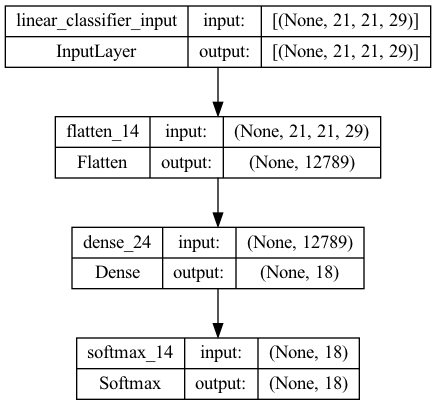

In [78]:
IMG_HEIGHT = 21
IMG_WIDTH = 21
# Define the linear classifier
def create_linear_classifier():
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, 29),
                   name='linear_classifier_input')
    x = Flatten()(inputs)
    x = Dense(18)(x)
    x = Softmax(axis=-1)(x)
    model = Model(inputs=inputs, outputs=x)
    return model

linear_classifier = create_linear_classifier()
plot_model(linear_classifier, show_shapes=True)

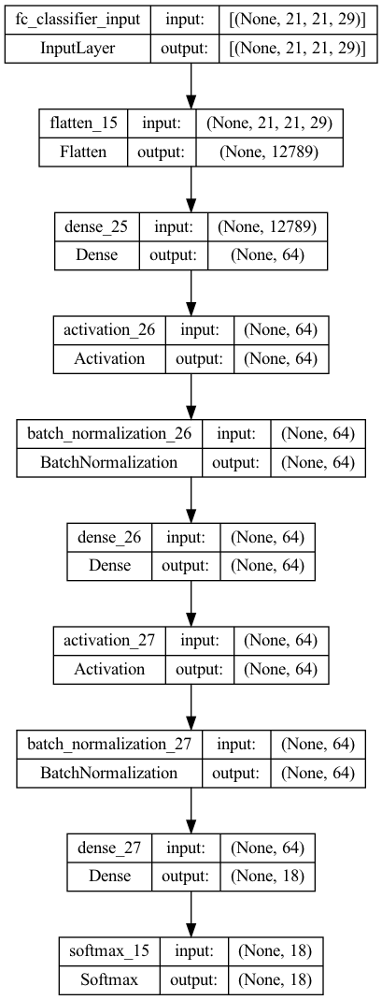

In [79]:
# Define the fully connected neural network
def create_fc_classifier():
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, 29),
                   name='fc_classifier_input')
    x = Flatten()(inputs)
    x = Dense(64)(x)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=-1)(x)
    x = Dense(64)(x)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=-1)(x)
    x = Dense(18)(x)
    x = Softmax(axis=-1)(x)
    model = Model(inputs=inputs, outputs=x)
    return model

fc_classifier = create_fc_classifier()
plot_model(fc_classifier, show_shapes=True)

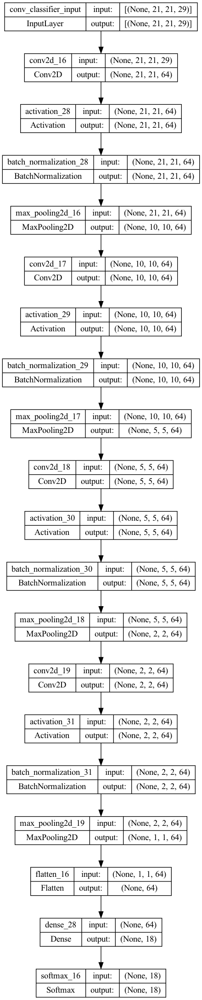

In [80]:
# Define the convolutional neural network
def create_conv_classifier():
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, 29),
                   name='conv_classifier_input')
    x = Conv2D(64, (3,3), padding='SAME')(inputs)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=-1)(x)
    x = MaxPool2D(strides=(2,2))(x) # 16, 16
    x = Conv2D(64, (3,3), padding='SAME')(x)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=-1)(x)
    x = MaxPool2D(strides=(2,2))(x) # 8,8
    x = Conv2D(64, (3,3), padding='SAME')(x)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=-1)(x)
    x = MaxPool2D(strides=(2,2))(x) # 4,4
    x = Conv2D(64, (3,3), padding='SAME')(x)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=-1)(x)
    x = MaxPool2D(strides=(2,2))(x) # 2,2
    x = Flatten()(x)
    x = Dense(18)(x)
    x = Softmax(axis=-1)(x)
    model = Model(inputs=inputs, outputs=x)
    return model

conv_classifier = create_conv_classifier()
plot_model(conv_classifier, show_shapes=True)

In [81]:
# Define the loss function
loss_function = tf.keras.losses.CategoricalCrossentropy() 

In [82]:
# Define the training algorithm
linear_optimizer = tf.keras.optimizers.Adam(lr=1e-3, clipnorm=0.001)
fc_optimizer = tf.keras.optimizers.Adam(lr=1e-3, clipnorm=0.001)
conv_optimizer = tf.keras.optimizers.Adam(lr=1e-3, clipnorm=0.001)

In [83]:
# Define training parameters
training_steps_per_epoch=512
n_epochs=30

# Define callbacks
linear_model_path = '../data/models/linear'

linear_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        linear_model_path, monitor='val_loss',
        save_best_only=True, verbose=1,
        save_weights_only=False)
]

linear_callbacks.append(
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, verbose=1,
        patience=3, min_lr=1e-7)
)

fc_model_path = '../data/models/fc'

fc_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        fc_model_path, monitor='val_loss',
        save_best_only=True, verbose=1,
        save_weights_only=False)
]

fc_callbacks.append(
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, verbose=1,
        patience=3, min_lr=1e-7)
)

conv_model_path = '../data/models/conv'

conv_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        conv_model_path, monitor='val_loss',
        save_best_only=True, verbose=1,
        save_weights_only=False)
]

conv_callbacks.append(
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, verbose=1,
        patience=3, min_lr=1e-7)
)

# Define metrics
recall_0 = tf.keras.metrics.Recall(class_id=0)
recall_1 = tf.keras.metrics.Recall(class_id=1)

precision_0 = tf.keras.metrics.Precision(class_id=0)
precision_1 = tf.keras.metrics.Precision(class_id=1)

In [84]:
# Compile models
linear_classifier.compile(optimizer=linear_optimizer, 
                          loss=loss_function, 
                          metrics = [recall_0, recall_1, precision_0, precision_1])

fc_classifier.compile(optimizer=fc_optimizer, 
                          loss=loss_function, 
                          metrics = [recall_0, recall_1, precision_0, precision_1])

conv_classifier.compile(optimizer=conv_optimizer, 
                          loss=loss_function, 
                          metrics = [recall_0, recall_1, precision_0, precision_1])

In [85]:
# Train the linear classifier
linear_classifier.fit(db.train_dataset,
                      validation_data=db.val_dataset,
                      epochs=n_epochs,
                      verbose=1,
                      callbacks=linear_callbacks)

Epoch 1/30
3/4 [=====================>........] - ETA: 0s - loss: 2.9638 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00
Epoch 1: val_loss improved from inf to 2.49279, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 236ms/step - loss: 2.9651 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00 - val_loss: 2.4928 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 2/30
3/4 [=====================>........] - ETA: 0s - loss: 2.4862 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00
Epoch 2: val_loss improved from 2.49279 to 2.26587, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 157ms/step - loss: 2.4795 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00 - val_loss: 2.2659 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 3/30
3/4 [=====================>........] - ETA: 0s - loss: 2.0358 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00
Epoch 3: val_loss improved from 2.26587 to 2.07926, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 156ms/step - loss: 2.0319 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00 - val_loss: 2.0793 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 4/30
3/4 [=====================>........] - ETA: 0s - loss: 1.7107 - recall_12: 0.0000e+00 - recall_13: 0.2000 - precision_12: 0.0000e+00 - precision_13: 1.0000        
Epoch 4: val_loss improved from 2.07926 to 1.84620, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 158ms/step - loss: 1.7049 - recall_12: 0.0000e+00 - recall_13: 0.2000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.8462 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 5/30
3/4 [=====================>........] - ETA: 0s - loss: 1.5038 - recall_12: 0.0000e+00 - recall_13: 0.4000 - precision_12: 0.0000e+00 - precision_13: 1.0000        
Epoch 5: val_loss improved from 1.84620 to 1.75023, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 166ms/step - loss: 1.5003 - recall_12: 0.0000e+00 - recall_13: 0.4000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.7502 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 6/30
3/4 [=====================>........] - ETA: 0s - loss: 1.3184 - recall_12: 0.0000e+00 - recall_13: 0.5714 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 6: val_loss improved from 1.75023 to 1.73627, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 176ms/step - loss: 1.3203 - recall_12: 0.0000e+00 - recall_13: 0.5333 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.7363 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 7/30
3/4 [=====================>........] - ETA: 0s - loss: 1.1862 - recall_12: 0.0000e+00 - recall_13: 0.7333 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 7: val_loss did not improve from 1.73627
4/4 [==============================] - 0s 26ms/step - loss: 1.1939 - recall_12: 0.0000e+00 - recall_13: 0.7333 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.7478 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 8/30
3/4 [=====================>........] - ETA: 0s - loss: 1.0527 - recall_12: 0.0000e+00 - recall_13: 0.7857 - precision_12: 0.0000e+00 - precision_13: 1.0

INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 158ms/step - loss: 1.0537 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.6470 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 9/30
3/4 [=====================>........] - ETA: 0s - loss: 0.9564 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 9: val_loss improved from 1.64696 to 1.61523, saving model to ../data/models/linear


INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 0s 156ms/step - loss: 0.9513 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.6152 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 10/30
3/4 [=====================>........] - ETA: 0s - loss: 0.9043 - recall_12: 0.0000e+00 - recall_13: 0.7857 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 10: val_loss did not improve from 1.61523
4/4 [==============================] - 0s 27ms/step - loss: 0.8891 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.6296 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 11/30
4/4 [==============================] - ETA: 0s - loss: 0.7767 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 

INFO:tensorflow:Assets written to: ../data/models/linear/assets


INFO:tensorflow:Assets written to: ../data/models/linear/assets


4/4 [==============================] - 1s 156ms/step - loss: 0.7767 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.6142 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 12/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7250 - recall_12: 0.0000e+00 - recall_13: 0.7857 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 12: val_loss did not improve from 1.61420
4/4 [==============================] - 0s 37ms/step - loss: 0.7234 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 1.8468 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 13/30
4/4 [==============================] - ETA: 0s - loss: 0.7018 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 

In [86]:
# Train the fully connected neural network
fc_classifier.fit(db.train_dataset,
                  validation_data=db.val_dataset,
                  epochs=n_epochs,
                  verbose=1,
                  callbacks=fc_callbacks)

Epoch 1/30
3/4 [=====================>........] - ETA: 0s - loss: 3.3254 - recall_12: 0.0000e+00 - recall_13: 0.0714 - precision_12: 0.0000e+00 - precision_13: 0.2000        
Epoch 1: val_loss improved from inf to 2.76759, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 3s 475ms/step - loss: 3.3325 - recall_12: 0.0000e+00 - recall_13: 0.0667 - precision_12: 0.0000e+00 - precision_13: 0.2000 - val_loss: 2.7676 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 2/30
3/4 [=====================>........] - ETA: 0s - loss: 2.3607 - recall_12: 0.0000e+00 - recall_13: 0.2667 - precision_12: 0.0000e+00 - precision_13: 0.4444
Epoch 2: val_loss improved from 2.76759 to 2.72515, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 396ms/step - loss: 2.3715 - recall_12: 0.0000e+00 - recall_13: 0.2667 - precision_12: 0.0000e+00 - precision_13: 0.4444 - val_loss: 2.7251 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 3/30
3/4 [=====================>........] - ETA: 0s - loss: 2.0293 - recall_12: 0.0000e+00 - recall_13: 0.6667 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 3: val_loss did not improve from 2.72515
4/4 [==============================] - 0s 33ms/step - loss: 2.0323 - recall_12: 0.0000e+00 - recall_13: 0.6667 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.8402 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 4/30
3/4 [=====================>........] - ETA: 0s - loss: 1.5826 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0

INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 394ms/step - loss: 0.7935 - recall_12: 1.0000 - recall_13: 0.8667 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.6763 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 18/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7422 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000        
Epoch 18: val_loss improved from 2.67631 to 2.61585, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 419ms/step - loss: 0.7533 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.6158 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 19/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7032 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 19: val_loss improved from 2.61585 to 2.55177, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 442ms/step - loss: 0.7219 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.5518 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 20/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7192 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000        
Epoch 20: val_loss improved from 2.55177 to 2.49976, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 2s 508ms/step - loss: 0.7270 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.4998 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 21/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7253 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 0.9333        
Epoch 21: val_loss improved from 2.49976 to 2.45164, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 398ms/step - loss: 0.7345 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 0.9333 - val_loss: 2.4516 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 22/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7483 - recall_12: 0.0000e+00 - recall_13: 0.9231 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 22: val_loss improved from 2.45164 to 2.40171, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 405ms/step - loss: 0.7555 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.4017 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 23/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7055 - recall_12: 0.0000e+00 - recall_13: 0.9286 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 23: val_loss improved from 2.40171 to 2.36549, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 377ms/step - loss: 0.7194 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.3655 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 24/30
3/4 [=====================>........] - ETA: 0s - loss: 0.6304 - recall_12: 1.0000 - recall_13: 0.8000 - precision_12: 1.0000 - precision_13: 1.0000        
Epoch 24: val_loss improved from 2.36549 to 2.33327, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 451ms/step - loss: 0.6603 - recall_12: 1.0000 - recall_13: 0.8000 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.3333 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 25/30
3/4 [=====================>........] - ETA: 0s - loss: 0.6653 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 25: val_loss improved from 2.33327 to 2.30523, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 423ms/step - loss: 0.6878 - recall_12: 0.0000e+00 - recall_13: 0.8000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.3052 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 26/30
3/4 [=====================>........] - ETA: 0s - loss: 0.6682 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 26: val_loss improved from 2.30523 to 2.27882, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 2s 522ms/step - loss: 0.6841 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.2788 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 27/30
3/4 [=====================>........] - ETA: 0s - loss: 0.6339 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 27: val_loss improved from 2.27882 to 2.25585, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 414ms/step - loss: 0.6535 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.2558 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 28/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7036 - recall_12: 0.0000e+00 - recall_13: 0.9286 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 28: val_loss improved from 2.25585 to 2.23122, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 429ms/step - loss: 0.7037 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.2312 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 29/30
3/4 [=====================>........] - ETA: 0s - loss: 0.6330 - recall_12: 0.0000e+00 - recall_13: 0.8571 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 29: val_loss improved from 2.23122 to 2.20799, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 2s 492ms/step - loss: 0.6448 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.2080 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05
Epoch 30/30
2/4 [==============>...............] - ETA: 0s - loss: 0.6707 - recall_12: 1.0000 - recall_13: 0.9091 - precision_12: 1.0000 - precision_13: 1.0000
Epoch 30: val_loss improved from 2.20799 to 2.19547, saving model to ../data/models/fc


INFO:tensorflow:Assets written to: ../data/models/fc/assets


INFO:tensorflow:Assets written to: ../data/models/fc/assets


4/4 [==============================] - 1s 416ms/step - loss: 0.6488 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.1955 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 6.2500e-05


In [87]:
# Train the convolutional neural network
conv_classifier.fit(db.train_dataset,
                    validation_data=db.val_dataset,
                    epochs=n_epochs,
                    verbose=1,
                    callbacks=conv_callbacks)

Epoch 1/30
3/4 [=====================>........] - ETA: 0s - loss: 4.3327 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00
Epoch 1: val_loss improved from inf to 2.87531, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 5s 884ms/step - loss: 4.2919 - recall_12: 0.0000e+00 - recall_13: 0.0000e+00 - precision_12: 0.0000e+00 - precision_13: 0.0000e+00 - val_loss: 2.8753 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 2/30
3/4 [=====================>........] - ETA: 0s - loss: 2.7712 - recall_12: 0.0000e+00 - recall_13: 0.7333 - precision_12: 0.0000e+00 - precision_13: 0.8462
Epoch 2: val_loss improved from 2.87531 to 2.85983, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 697ms/step - loss: 2.7842 - recall_12: 0.0000e+00 - recall_13: 0.7333 - precision_12: 0.0000e+00 - precision_13: 0.8462 - val_loss: 2.8598 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 3/30
3/4 [=====================>........] - ETA: 0s - loss: 2.0834 - recall_12: 0.0000e+00 - recall_13: 0.5333 - precision_12: 0.0000e+00 - precision_13: 0.8889
Epoch 3: val_loss improved from 2.85983 to 2.84431, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 687ms/step - loss: 2.0945 - recall_12: 0.0000e+00 - recall_13: 0.5333 - precision_12: 0.0000e+00 - precision_13: 0.8889 - val_loss: 2.8443 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 4/30
3/4 [=====================>........] - ETA: 0s - loss: 1.6423 - recall_12: 0.0000e+00 - recall_13: 0.8462 - precision_12: 0.0000e+00 - precision_13: 0.7857
Epoch 4: val_loss improved from 2.84431 to 2.82450, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 604ms/step - loss: 1.6540 - recall_12: 0.0000e+00 - recall_13: 0.7333 - precision_12: 0.0000e+00 - precision_13: 0.7857 - val_loss: 2.8245 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 5/30
3/4 [=====================>........] - ETA: 0s - loss: 1.3529 - recall_12: 0.0000e+00 - recall_13: 0.8571 - precision_12: 0.0000e+00 - precision_13: 0.9231
Epoch 5: val_loss improved from 2.82450 to 2.80374, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 3s 807ms/step - loss: 1.3644 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 0.9286 - val_loss: 2.8037 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 6/30
3/4 [=====================>........] - ETA: 0s - loss: 1.1783 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 0.9286
Epoch 6: val_loss improved from 2.80374 to 2.78813, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 580ms/step - loss: 1.2077 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 0.9286 - val_loss: 2.7881 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 7/30
3/4 [=====================>........] - ETA: 0s - loss: 1.0397 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 0.9333
Epoch 7: val_loss improved from 2.78813 to 2.76593, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 611ms/step - loss: 1.0583 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 0.9333 - val_loss: 2.7659 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 8/30
3/4 [=====================>........] - ETA: 0s - loss: 0.8106 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 8: val_loss improved from 2.76593 to 2.74361, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 737ms/step - loss: 0.8205 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.7436 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 9/30
3/4 [=====================>........] - ETA: 0s - loss: 0.7302 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 9: val_loss improved from 2.74361 to 2.71347, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 596ms/step - loss: 0.7323 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.7135 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 10/30
3/4 [=====================>........] - ETA: 0s - loss: 0.6453 - recall_12: 0.0000e+00 - recall_13: 0.8571 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 10: val_loss improved from 2.71347 to 2.68476, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 563ms/step - loss: 0.6682 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.6848 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 11/30
3/4 [=====================>........] - ETA: 0s - loss: 0.5617 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 11: val_loss improved from 2.68476 to 2.64137, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 686ms/step - loss: 0.5685 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.6414 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 12/30
3/4 [=====================>........] - ETA: 0s - loss: 0.4888 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 0.9286
Epoch 12: val_loss improved from 2.64137 to 2.61659, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 638ms/step - loss: 0.5093 - recall_12: 0.0000e+00 - recall_13: 0.8667 - precision_12: 0.0000e+00 - precision_13: 0.9286 - val_loss: 2.6166 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 13/30
3/4 [=====================>........] - ETA: 0s - loss: 0.3736 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000       
Epoch 13: val_loss improved from 2.61659 to 2.61184, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 636ms/step - loss: 0.4266 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.6118 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 14/30
3/4 [=====================>........] - ETA: 0s - loss: 0.3739 - recall_12: 0.0000e+00 - recall_13: 0.9286 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 14: val_loss improved from 2.61184 to 2.60487, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 604ms/step - loss: 0.3771 - recall_12: 0.0000e+00 - recall_13: 0.9333 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.6049 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 15/30
3/4 [=====================>........] - ETA: 0s - loss: 0.3129 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000       
Epoch 15: val_loss improved from 2.60487 to 2.59488, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 720ms/step - loss: 0.3341 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.5949 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 16/30
3/4 [=====================>........] - ETA: 0s - loss: 0.2639 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000
Epoch 16: val_loss improved from 2.59488 to 2.57670, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 581ms/step - loss: 0.2643 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.5767 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 17/30
3/4 [=====================>........] - ETA: 0s - loss: 0.2866 - recall_12: 1.0000 - recall_13: 0.9286 - precision_12: 1.0000 - precision_13: 1.0000        
Epoch 17: val_loss improved from 2.57670 to 2.57603, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 592ms/step - loss: 0.2845 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.5760 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 18/30
3/4 [=====================>........] - ETA: 0s - loss: 0.1943 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 18: val_loss improved from 2.57603 to 2.54938, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 576ms/step - loss: 0.2008 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.5494 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 19/30
3/4 [=====================>........] - ETA: 0s - loss: 0.2117 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 19: val_loss improved from 2.54938 to 2.50458, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 727ms/step - loss: 0.2332 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.5046 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 20/30
3/4 [=====================>........] - ETA: 0s - loss: 0.1558 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000       
Epoch 20: val_loss improved from 2.50458 to 2.49133, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 556ms/step - loss: 0.1737 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.4913 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 21/30
3/4 [=====================>........] - ETA: 0s - loss: 0.1819 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000
Epoch 21: val_loss did not improve from 2.49133
4/4 [==============================] - 0s 72ms/step - loss: 0.1942 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.5185 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 22/30
3/4 [=====================>........] - ETA: 0s - loss: 0.1214 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000
Epoch 22:

INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 598ms/step - loss: 0.1224 - recall_12: 0.0000e+00 - recall_13: 1.0000 - precision_12: 0.0000e+00 - precision_13: 1.0000 - val_loss: 2.4880 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 24/30
3/4 [=====================>........] - ETA: 0s - loss: 0.1439 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000
Epoch 24: val_loss improved from 2.48805 to 2.47973, saving model to ../data/models/conv


INFO:tensorflow:Assets written to: ../data/models/conv/assets


INFO:tensorflow:Assets written to: ../data/models/conv/assets


4/4 [==============================] - 2s 693ms/step - loss: 0.1483 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.4797 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 25/30
3/4 [=====================>........] - ETA: 0s - loss: 0.0779 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000
Epoch 25: val_loss did not improve from 2.47973
4/4 [==============================] - 0s 72ms/step - loss: 0.0871 - recall_12: 1.0000 - recall_13: 0.9333 - precision_12: 1.0000 - precision_13: 1.0000 - val_loss: 2.4942 - val_recall_12: 0.0000e+00 - val_recall_13: 0.0000e+00 - val_precision_12: 0.0000e+00 - val_precision_13: 0.0000e+00 - lr: 0.0010
Epoch 26/30
3/4 [=====================>........] - ETA: 0s - loss: 0.0812 - recall_12: 1.0000 - recall_13: 1.0000 - precision_12: 1.0000 - precision_13: 1.0000
Epoch 26: val_loss did no

In [88]:
# Generate predictions
test_list = list(db.test_dataset.as_numpy_iterator())
X_test = [item[0] for item in test_list]
y_test = [item[1] for item in test_list]

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)
y_test = np.argmax(y_test, axis=-1)

# Compute linear classifier metrics
y_pred = linear_classifier.predict(X_test)
y_pred = np.argmax(y_pred, axis=-1)

recall = sklearn.metrics.recall_score(y_test, y_pred, average='weighted')
precision = sklearn.metrics.precision_score(y_test, y_pred, average='weighted')
f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')

print('Linear Recall: {}'.format(recall))
print('Linear Precision: {}'.format(precision))
print('Linear F1 Score: {}'.format(f1))

# Compute conv metrics
y_pred = fc_classifier.predict(X_test)
y_pred = np.argmax(y_pred, axis=-1)

recall = sklearn.metrics.recall_score(y_test, y_pred, average='weighted')
precision = sklearn.metrics.precision_score(y_test, y_pred, average='weighted')
f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')

print('Fully Connected Recall: {}'.format(recall))
print('Fully Connected Precision: {}'.format(precision))
print('Fully Connected F1 Score: {}'.format(f1))

# Compute conv metrics
y_pred = conv_classifier.predict(X_test)
y_pred = np.argmax(y_pred, axis=-1)

recall = sklearn.metrics.recall_score(y_test, y_pred, average='weighted')
precision = sklearn.metrics.precision_score(y_test, y_pred, average='weighted')
f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')

print('Conv Recall: {}'.format(recall))
print('Conv Precision: {}'.format(precision))
print('Conv F1 Score: {}'.format(f1))


1/1 [==============================] - 0s 40ms/step
Linear Recall: 0.44
Linear Precision: 0.5
Linear F1 Score: 0.4533333333333333


/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 [==============================] - 0s 85ms/step
Fully Connected Recall: 0.32
Fully Connected Precision: 0.496
Fully Connected F1 Score: 0.3


/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 [==============================] - 0s 131ms/step
Conv Recall: 0.12
Conv Precision: 0.05942857142857143
Conv F1 Score: 0.07111111111111111


/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/envs/bebi205/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [93]:
# Generate predictions
test_list = list(db.test_dataset.as_numpy_iterator())
X_test = [item[0] for item in test_list]
y_test = [item[1] for item in test_list]

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)
y_test = np.argmax(y_test, axis=-1)

# Compute linear classifier metrics
y_pred = linear_classifier.predict(X_test)
y_pred = np.argmax(y_pred, axis=-1)

confusion_matrix = sklearn.metrics.confusion_matrix(y_test, y_pred)
confusion_matrix

1/1 [==============================] - 0s 19ms/step


array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

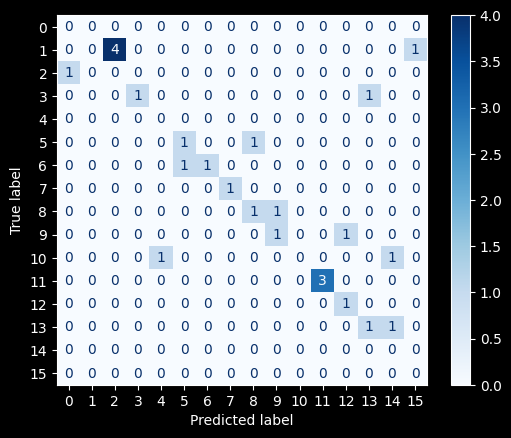

In [101]:
import matplotlib.pyplot as plt


cm_display = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix)
cm_display.plot(cmap=plt.cm.Blues)
plt.show()
